# 1. Supervised Learning and Transfer Learning

Supervised pretraining on large labeled datasets has led to successful transfer learning

- ImageNet

- Pretrain for fine-grained image classification of 1000 classes



<br>
<center>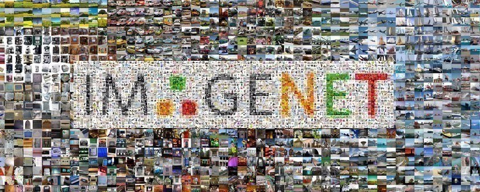</center>
<br>




- Use feature representations for downstream tasks, e.g., object detection, image segmentation, and action recognition


<br>
<center>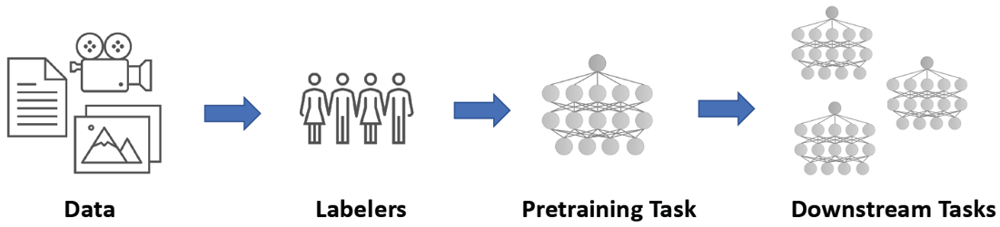</center>
<br>




But supervised pretraining comes at a cost …
- Time-consuming and expensive to label datasets for new tasks


- Domain expertise needed for specialized tasks
    - Radiologists to label medical images
    - Native speakers or language specialists for labeling text in different languages


- To relieve the burden of labelling,
    - Semi-supervised learning
    - Weakly-supervised learning
    - Unsupervised learning

<br>

__Self-supervised learning__

- Self-supervised learning (SSL): supervise using labels generated from the data without any manual or weak label sources
    - Sub-class of unsupervised learning


- Idea: Hide or modify part of the input. Ask model to recover input or classify what changed
    - Self-supervised task referred to as the pretext task can be formulated using only unlabeled data
    - The features obtained from pretext tasks are transferred to downstream tasks like classification, object detection, and segmentation



<br>
<center>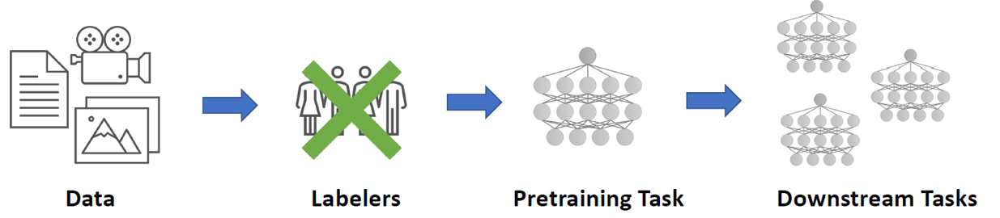</center>
<br>




__Pretext Tasks__

- Solving the pretext tasks allow the model to learn good features.

- We can automatically generate labels for the pretext tasks.




<br>
<center>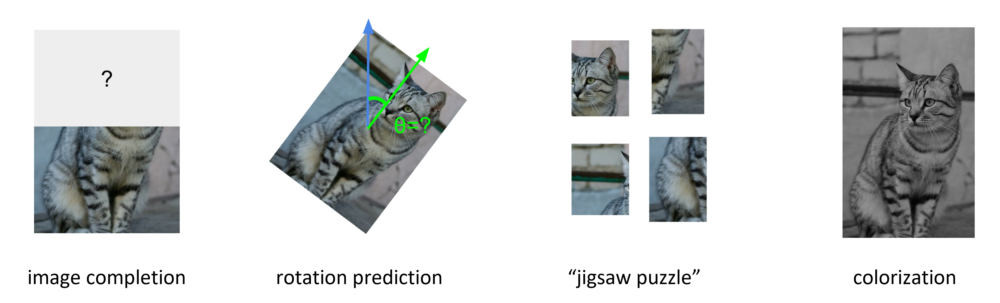</center>
<br>

# 2. Pretext Tasks


## 2.1. Pretext Task - Context Prediction

- After creating 9 patches from one input image, the classifier is trained on the location information between the middle and other patches


- A pair of middle patch and other patch is given as the input for the network


- Method to avoid trivial solutions
    - uneven spacing between patches




<br>
<center>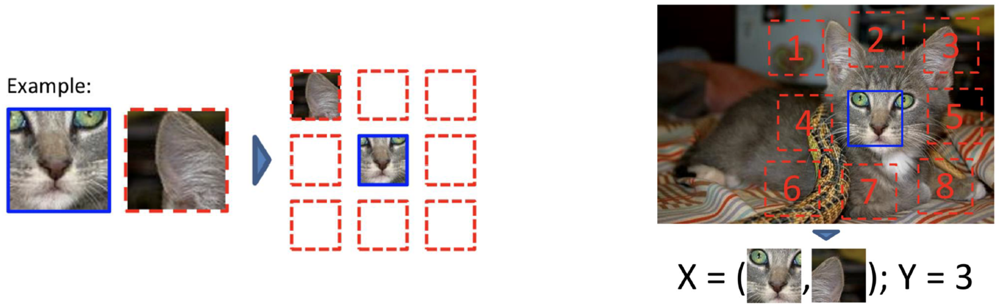</center>
<br>



Carl Doersch, Abhinav Gupta, Alexei A. Efros, 2015, "Unsupervised Visual Representation Learning by Context Prediction," Proceedings of the IEEE International Conference on Computer Vision (ICCV), pp. 1422-1430.


## 2.2. Pretext Task - Jigsaw Puzzle

- Generate 9 patches from the input image


- After shuffling the patches, learn a classifier that predicts permutations to return to the original position




<br>
<center>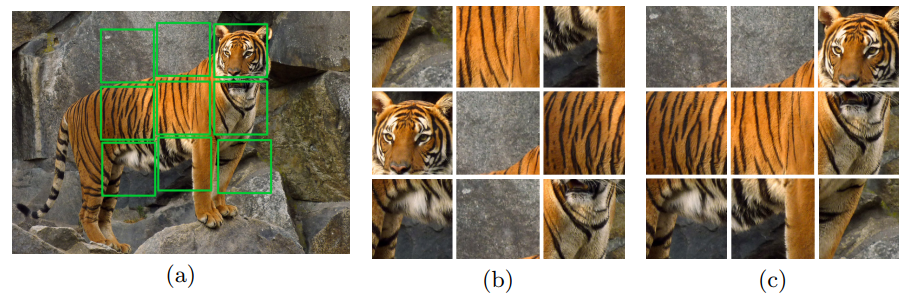</center>
<br>




<br>
<center>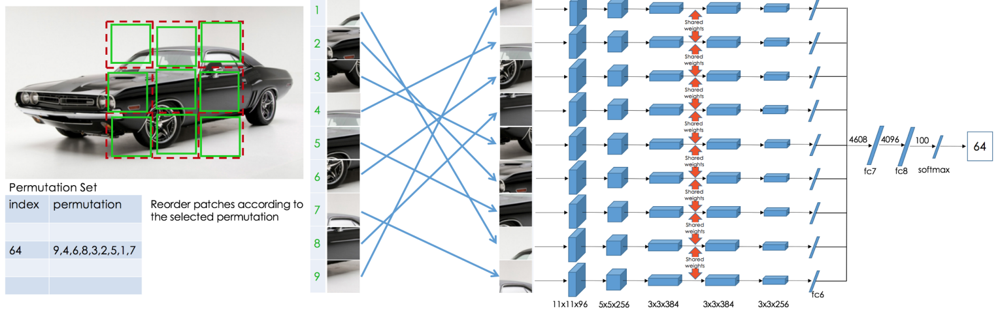</center>
<br>



Noroozi, M., and Favaro, P., 2016, "Unsupervised Learning of Visual Representations by Solving Jigsaw Puzzles," Computer Vision – ECCV 2016, 69–84.


## 2.3. Pretext Task - Image Colorization

- Given a grayscale photograph as input, image colorization attacks the problem of hallucinating a plausible color version of the photograph


- Transfer the trained encoder to the downstream task




<br>
<center>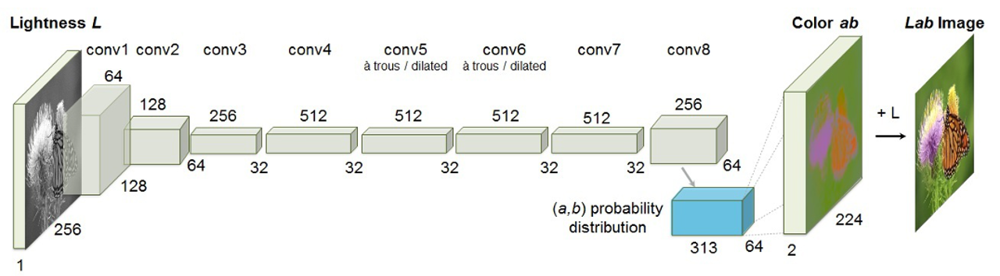</center>
<br>




Zhang, R., Isola, P., and Efros, A. A., 2016, "Colorful Image Colorization," Computer Vision – ECCV 2016, 649–666.


- Training data generation for self-supervised learning



<br>
<center>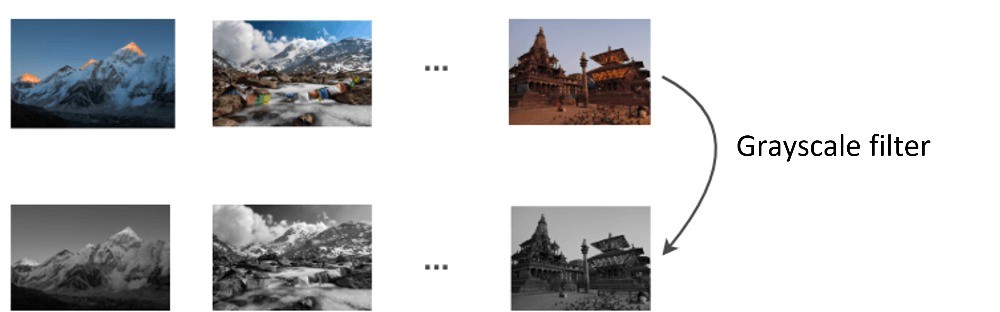</center>
<br>




- Network architecture



<br>
<center>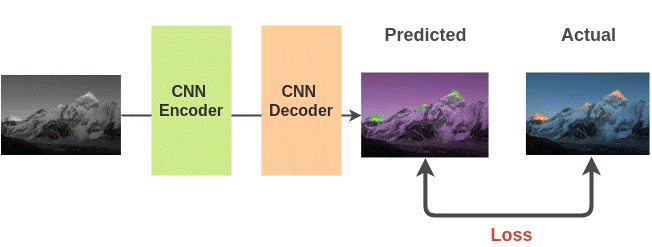</center>
<br>





## 2.4. Pretext Task - Image Super-resolution


- What if we prepared training pairs of (small, upscaled) images by downsampling millions of images we have freely available?


- Training data generation for self-supervised learning



<br>
<center>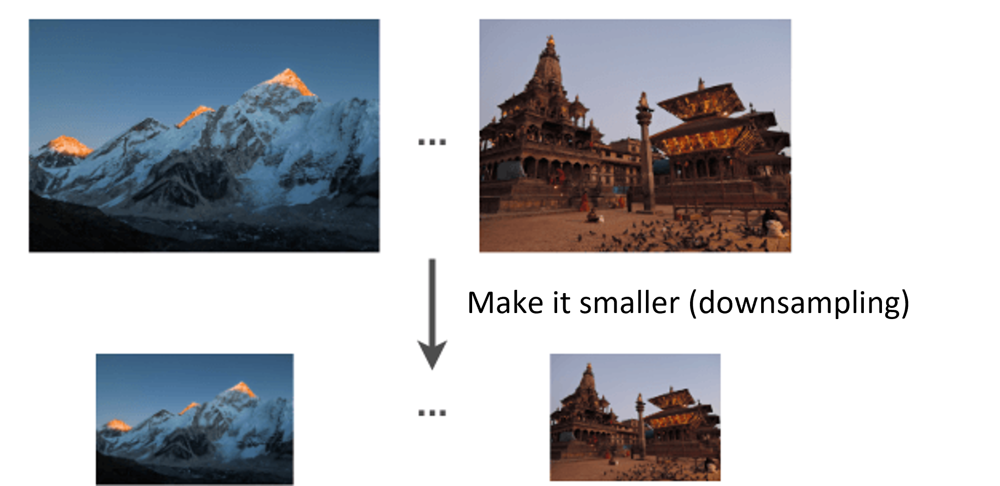</center>
<br>




- Network architecture




<br>
<center>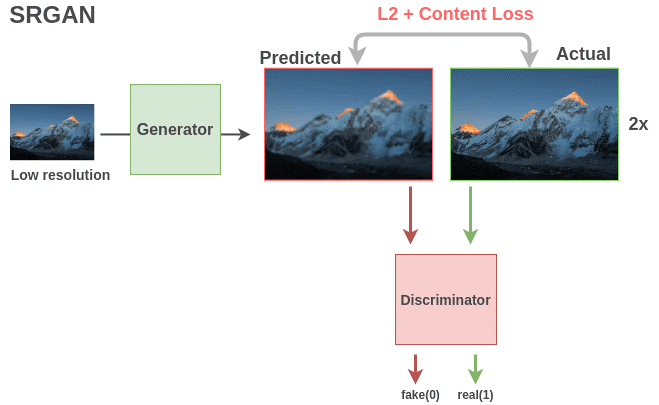</center>
<br>




## 2.5. Pretext Task - Image Inpainting


- What if we prepared training pairs of (corrupted, fixed) images by randomly removing part of images?


- Training data generation for self-supervised learning



<br>
<center>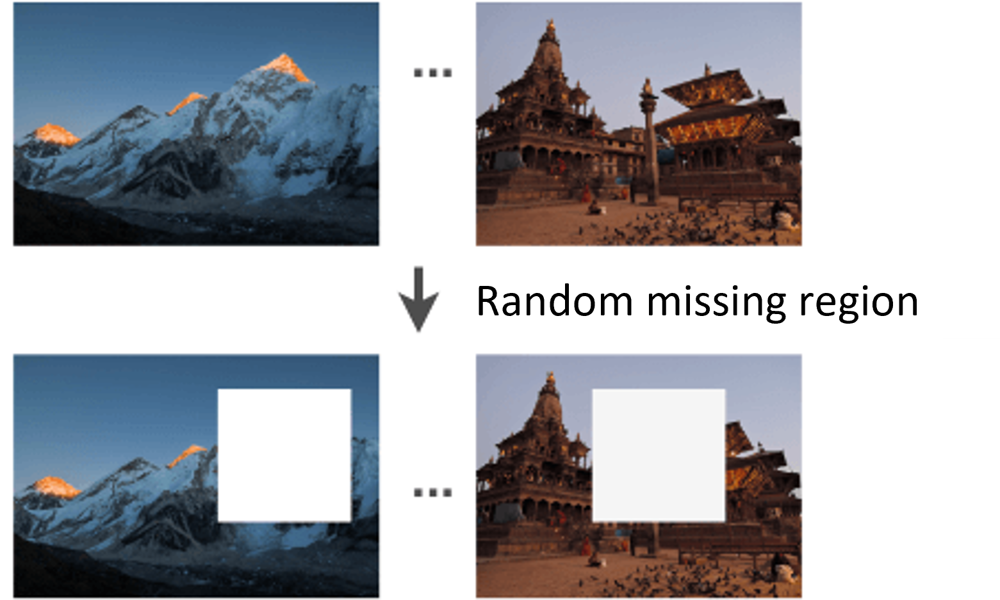</center>
<br>




- Network architecture



<br>
<center>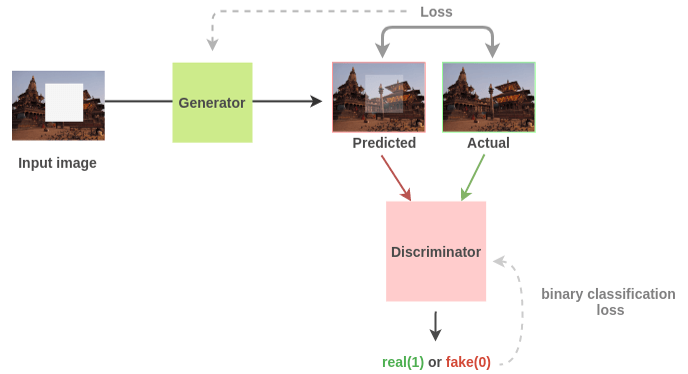</center>
<br>

# 3. Self-supervised Learning


__Benefits of Self-supervised Learning__

- Like supervised pretraining, can learn general-purpose feature representations for downstream tasks


- Reduce expense of hand-labeling large datasets


- Can leverage nearly unlimited unlabeled data available on the web

<br>

__Pipeline of Self-supervised Learning__

1. Within pretext tasks, deep neural network learns visual features of input unlabeled data


2. The learned parameters of the network remain fixed and the trained network serves as a pre-trained model for downstream tasks


3. The pre-trained model is transferred to downstream tasks and is fine-tuned


4. The performance of downstream tasks is used to evaluate the methodology used in pretext tasks to learn features from unlabeled data




<br>
<center>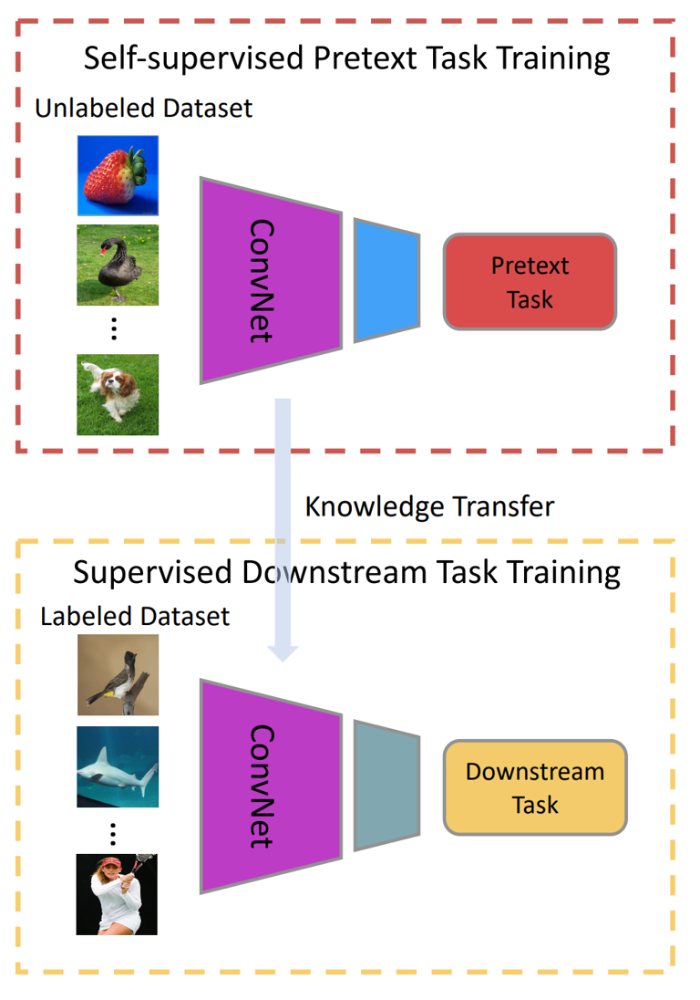</center>
<br>



Jing, L., & Tian, Y., 2021, "Self-supervised visual feature learning with Deep Neural Networks: A survey," IEEE Transactions on Pattern Analysis and Machine Intelligence, 43(11), 4037–4058.


__Downstream Tasks__


- After transferring the neural network pre-trained by the pretext task, freeze the weights and build additional layers for the downstream tasks

- Wide variety of downstream tasks
    - Classification
    - Regression
    - Object detection
    - Segmentation




<br>
<center>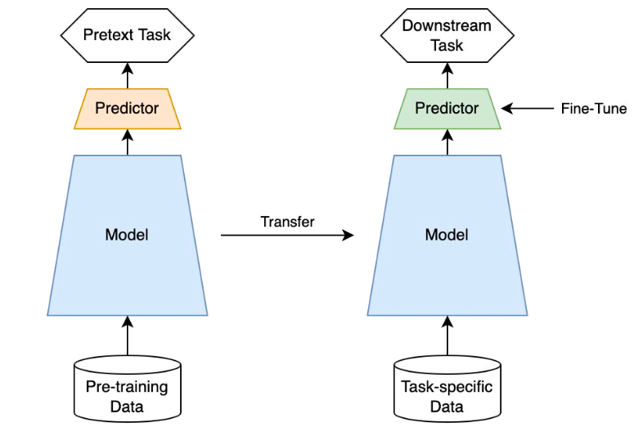</center>
<br>

# 4. Self-supervised Learning with TensorFlow

__Pretext Task - Rotation__

- RotNet


- Hypothesis: a model could recognize the correct rotation of an object only if it has the “visual commonsense” of what the object should look like

    - Self-supervised learning by rotating the entire input images
    - The model learns to predict which rotation is applied (4-way classification)




<br>
<center>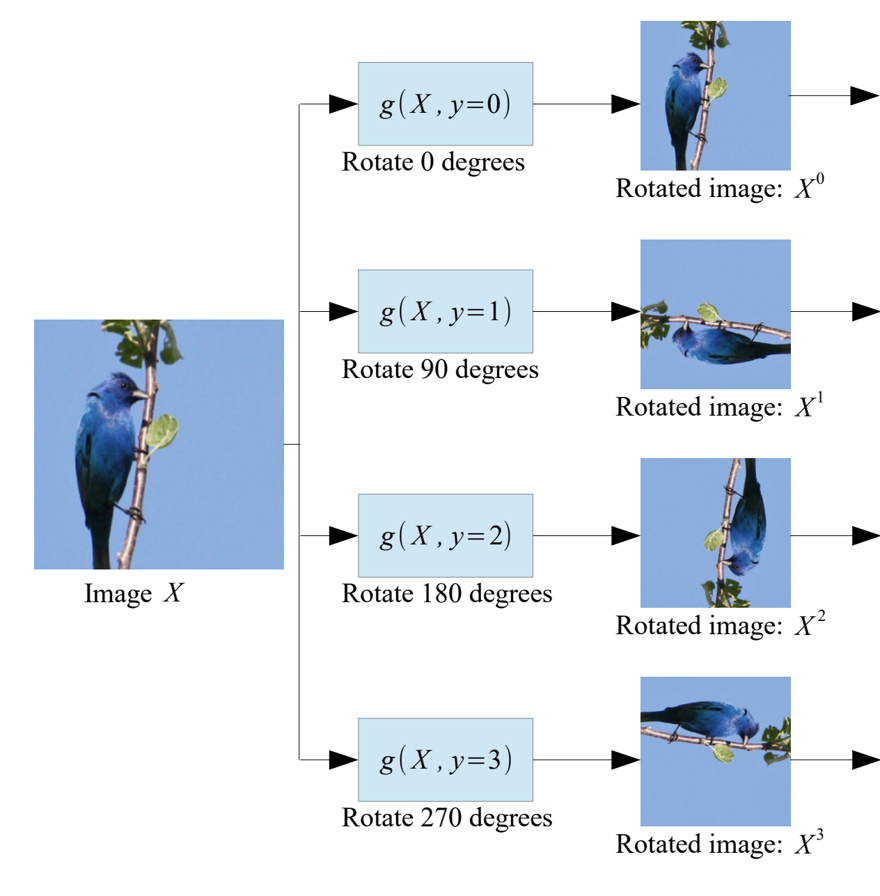</center>
<br>




- RotNet: Supervised vs Self-supervised
    - The accuracy gap between the RotNet based model and the fully supervised Network-In-Network (NIN) model is very small, only 1.64% points
    - We do not need data labels to train the RotNet based model but achieved similar accuracy with that of the model which used data labels for training


__Import Library__

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

__Load MNIST Data__

In [ ]:
(X_train, Y_train), (X_test, Y_test) = tf.keras.datasets.mnist.load_data()
XX_train = X_train[10000:11000]
YY_train = Y_train[10000:11000]
X_train = X_train[:10000]
Y_train = Y_train[:10000]
XX_test = X_test[300:600]
YY_test = Y_test[300:600]
X_test = X_test[:300]
Y_test = Y_test[:300]

11490434/11490434 [==============================] - 0s 0us/step


In [ ]:
print('shape of x_train:', X_train.shape)
print('shape of y_train:', Y_train.shape)
print('shape of xx_train:', XX_train.shape)
print('shape of yy_train:', YY_train.shape)
print('shape of x_test:', X_test.shape)
print('shape of y_test:', Y_test.shape)
print('shape of xx_test:', XX_test.shape)
print('shape of yy_test:', YY_test.shape)

shape of x_train: (10000, 28, 28)
shape of y_train: (10000,)
shape of xx_train: (1000, 28, 28)
shape of yy_train: (1000,)
shape of x_test: (300, 28, 28)
shape of y_test: (300,)
shape of xx_test: (300, 28, 28)
shape of yy_test: (300,)


## 4.1. Build RotNet for Pretext Task




<br>
<center>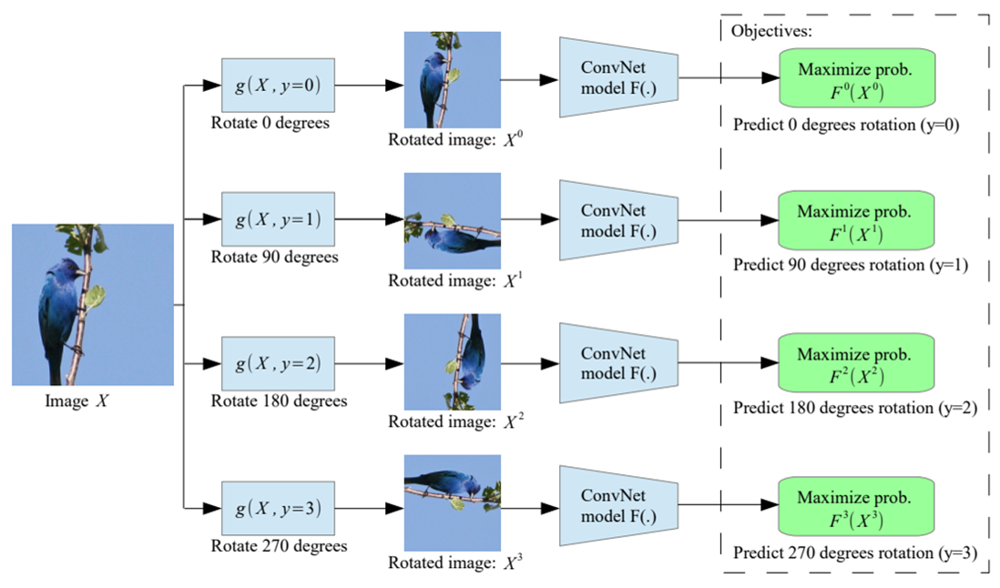</center>
<br>




__Dataset for Pretext Task (Rotation)__


Need to generate rotated images and their labels to train the model for pretext task

- [1, 0, 0, 0]: 0$^\circ $ rotation
- [0, 1, 0, 0]: 90$^\circ $ rotation
- [0, 0, 1, 0]: 180$^\circ $ rotation
- [0, 0, 0, 1]: 270$^\circ $ rotation


In [ ]:
n_samples = X_train.shape[0]
X_rotate = np.zeros(shape = (n_samples*4,
                             X_train.shape[1],
                             X_train.shape[2]))
Y_rotate = np.zeros(shape = (n_samples*4, 4))

for i in range(n_samples):
    img = X_train[i]
    X_rotate[4*i-4] = img
    Y_rotate[4*i-4] = tf.one_hot([0], depth = 4)

    # 90 degrees rotation
    X_rotate[4*i-3] = np.rot90(img, k = 1)
    Y_rotate[4*i-3] = tf.one_hot([1], depth = 4)

    # 180 degrees rotation
    X_rotate[4*i-2] = np.rot90(img, k = 2)
    Y_rotate[4*i-2] = tf.one_hot([2], depth = 4)

    # 270 degrees rotation
    X_rotate[4*i-1] = np.rot90(img, k = 3)
    Y_rotate[4*i-1] = tf.one_hot([3], depth = 4)

__Plot Dataset for Pretext Task (Rotation)__

(-0.5, 27.5, 27.5, -0.5)

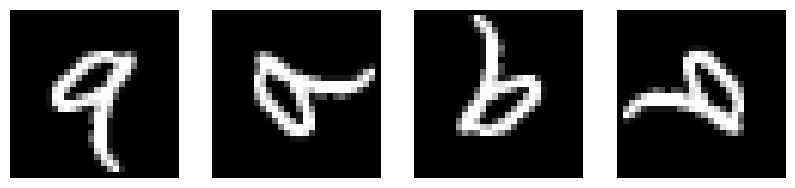

In [ ]:
plt.figure(figsize = (10, 10))

plt.subplot(141)
plt.imshow(X_rotate[12], cmap = 'gray')
plt.axis('off')

plt.subplot(142)
plt.imshow(X_rotate[13], cmap = 'gray')
plt.axis('off')

plt.subplot(143)
plt.imshow(X_rotate[14], cmap = 'gray')
plt.axis('off')

plt.subplot(144)
plt.imshow(X_rotate[15], cmap = 'gray')
plt.axis('off')

In [ ]:
X_rotate = X_rotate.reshape(-1,28,28,1)

__Build Model for Pretext Task (Rotation)__

In [ ]:
model_pretext = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(filters = 64,
                           kernel_size = (3,3),
                           strides = (2,2),
                           activation = 'relu',
                           padding = 'SAME',
                           input_shape = (28, 28, 1)),

    tf.keras.layers.MaxPool2D(pool_size = (2, 2),
                              strides = (2, 2)),

    tf.keras.layers.Conv2D(filters = 32,
                           kernel_size = (3,3),
                           strides = (1,1),
                           activation = 'relu',
                           padding = 'SAME',
                           input_shape = (7, 7, 64)),

    tf.keras.layers.MaxPool2D(pool_size = (2, 2),
                              strides = (2, 2)),

    tf.keras.layers.Conv2D(filters = 16,
                           kernel_size = (3,3),
                           strides = (2,2),
                           activation = 'relu',
                           padding = 'SAME',
                           input_shape = (3, 3, 32)),

    tf.keras.layers.Flatten(),

    tf.keras.layers.Dense(units = 4, activation = 'softmax')

])
model_pretext.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 14, 14, 64)        640       
                                                                 
 max_pooling2d (MaxPooling2  (None, 7, 7, 64)          0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 7, 7, 32)          18464     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 3, 3, 32)          0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 2, 2, 16)          4624      
                                                                 
 flatten (Flatten)           (None, 64)                0

- Training the model for the pretext task



<br>
<center>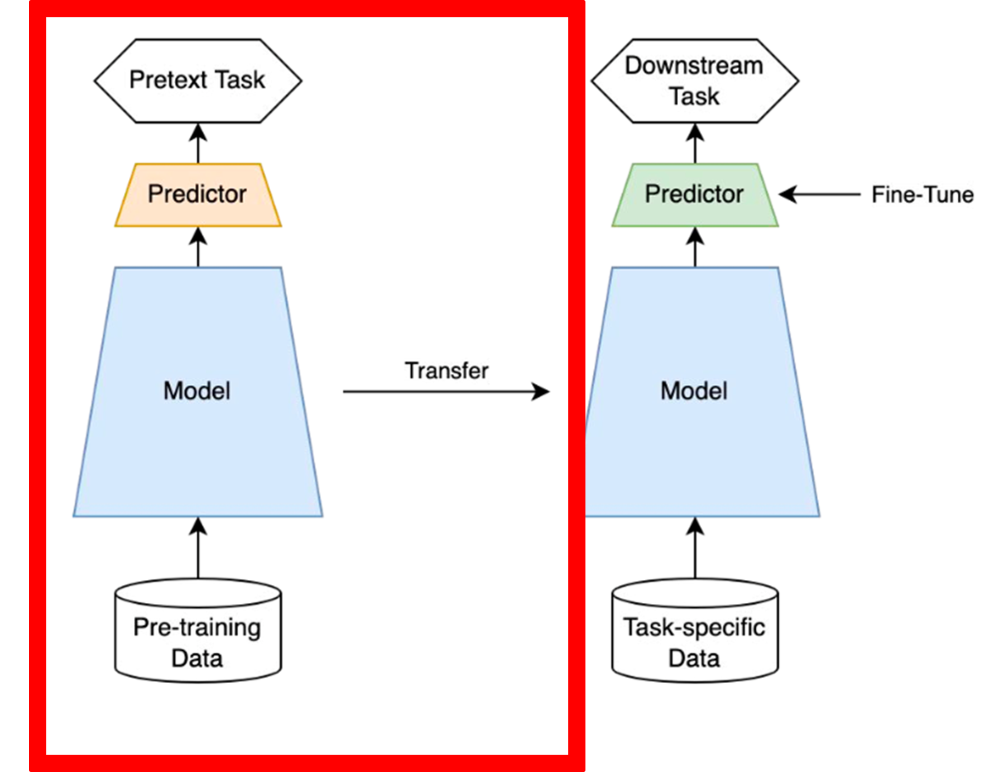</center>
<br>

In [ ]:
model_pretext.compile(optimizer = 'adam',
                      loss = 'categorical_crossentropy',
                      metrics = 'accuracy')

model_pretext.fit(X_rotate,
                  Y_rotate,
                  batch_size = 192,
                  epochs = 50,
                  verbose = 0,
                  shuffle = False)

## 4.2. Build Downstream Task (MNIST Image Classification)

- Freezing trained parameters to transfer them for the downstream task

In [ ]:
model_pretext.trainable = False

__Reshape Dataset__

In [ ]:
XX_train = XX_train.reshape(-1,28,28,1)
XX_test = XX_test.reshape(-1,28,28,1)
YY_train = tf.one_hot(YY_train, 10,on_value = 1.0, off_value = 0.0)
YY_test = tf.one_hot(YY_test, 10,on_value = 1.0, off_value = 0.0)

__Build Model__

- Model: two convolution layers and one fully connected layer
    - Two convolution layers are transferred from the model for the pretext task
    - Single fully connected layer is trained only




<br>
<center>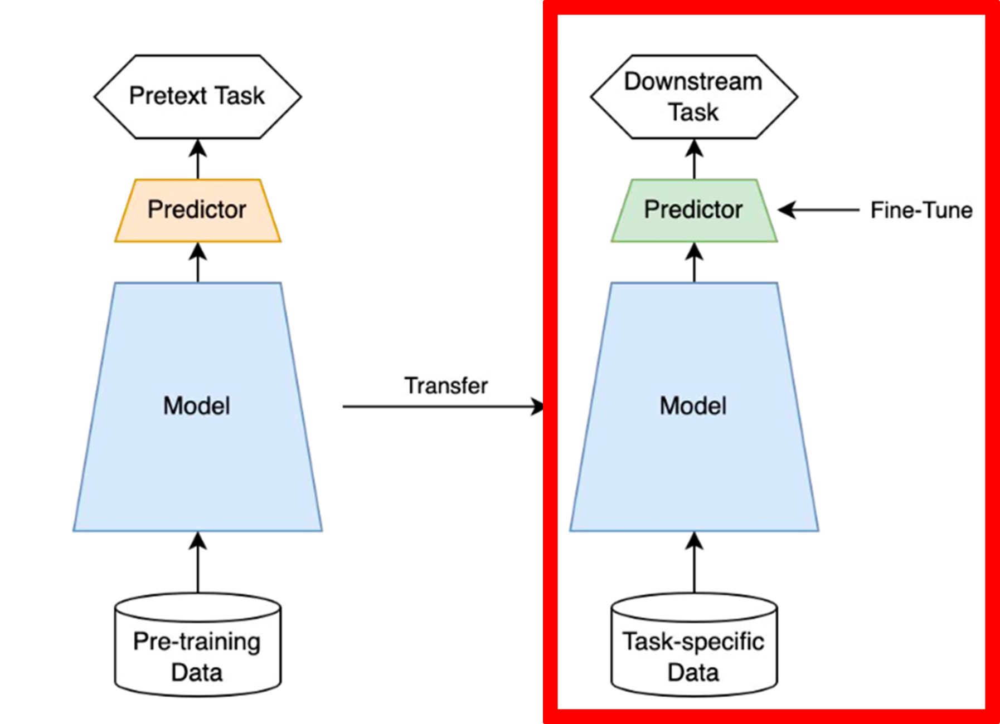</center>
<br>

In [ ]:
model_downstream = tf.keras.models.Sequential([
    model_pretext.get_layer(index = 0),
    model_pretext.get_layer(index = 1),
    model_pretext.get_layer(index = 2),
    model_pretext.get_layer(index = 3),

    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(units = 10, activation = 'softmax')
])

model_downstream.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 14, 14, 64)        640       
                                                                 
 max_pooling2d (MaxPooling2  (None, 7, 7, 64)          0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 7, 7, 32)          18464     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 3, 3, 32)          0         
 g2D)                                                            
                                                                 
 flatten_1 (Flatten)         (None, 288)               0         
                                                                 
 dense_1 (Dense)             (None, 10)               

In [24]:
model_downstream.compile(
    optimizer = tf.keras.optimizers.SGD(learning_rate = 0.001, momentum = 0.9),
    loss = 'categorical_crossentropy',
    metrics = ['accuracy']  # Corrigé ici : liste au lieu d'une simple chaîne
)

model_downstream.fit(
    XX_train,
    YY_train,
    batch_size = 64,
    validation_split = 0.2,
    epochs = 50,
    verbose = 0,
    callbacks = tf.keras.callbacks.EarlyStopping(monitor = 'accuracy', patience = 7)
)


__Downstream Task Trained Result (Image Classification Result)__

1/1 [==============================] - 0s 18ms/step


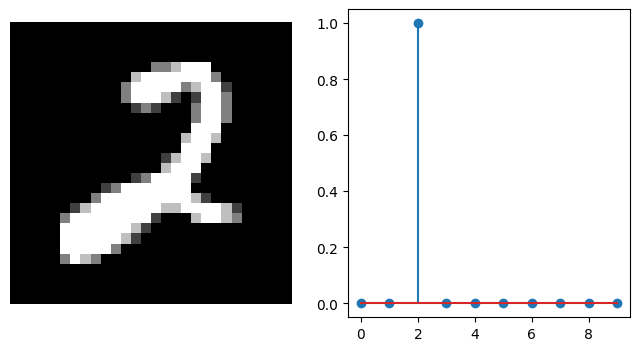

Prediction : 2


In [ ]:
name = ['0', '1', '2', '3', '4', '5', '6', '7', '8', '9']
idx = 9
img = XX_train[idx].reshape(-1,28,28,1)
label = YY_train[idx]
predict = model_downstream.predict(img)
mypred = np.argmax(predict, axis = 1)

plt.figure(figsize = (8, 4))
plt.subplot(1,2,1)
plt.imshow(img.reshape(28, 28), 'gray')
plt.axis('off')
plt.subplot(1,2,2)
plt.stem(predict[0])
plt.show()

print('Prediction : {}'.format(name[mypred[0]]))

Many images from https://amitness.com/2020/02/illustrated-self-supervised-learning/